In [1]:
!pip install git+https://github.com/huggingface/diffusers

  Cloning https://github.com/huggingface/diffusers to /tmp/pip-req-build-hml0g4pn
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers /tmp/pip-req-build-hml0g4pn
  Resolved https://github.com/huggingface/diffusers to commit 58519283e7fa143d3ae2bc086fcf53264cf2ece3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.36.0.dev0-py3-none-any.whl size=4637058 sha256=4520d510aeb59d89e08feaec4d5bcc1aac9973b76b5feaaa3ef20b4fcd501f5f
  Stored in directory: /tmp/pip-ephem-wheel-cache-ti0pcren/wheels/90/d4/44/a58bc00fb405fefb633b0d9d2307f6e3aec6cc1775d82555d3
Successfully built diffusers
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.36.0
    Uninstalling diffusers-0.36.0:
      Successfully uninstalled diffusers-0.36.0


In [2]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from diffusers.utils import load_image
import matplotlib.pyplot as plt
from PIL import Image
import os

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


# CONFIGURATION

In [18]:
# Path to your final trained model
FINAL_MODEL_DIR = "/content/drive/MyDrive/controlnet_model_output_v1"
# Path to an early checkpoint (e.g., step 1000) for Ablation C
EARLY_CKPT_DIR = os.path.join(FINAL_MODEL_DIR, "checkpoint-1000", "controlnet")
# Path to the base Stable Diffusion model
BASE_MODEL = "runwayml/stable-diffusion-v1-5"

# Loading the Dataset (Same as Training Script)

In [4]:
import zipfile
import shutil
import json
from pathlib import Path

# --- CONFIGURATION ---
# UPDATE THIS PATH to where your zip file is in your Drive
ZIP_PATH = "/content/drive/MyDrive/ControlNet_Datasets/final_dataset_v4_backup.zip"
dataset_root = Path("/content/dataset")

# 1. Unzip the dataset to local Colab storage
if not dataset_root.exists():
    print(f"Unzipping {ZIP_PATH}...")
    with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(dataset_root)
    print("Unzip complete.")

# 2. Restructure for 'imagefolder' loading
# This function moves .jsonl files into the folders and renames them to metadata.jsonl
def prepare_folder(split_name):
    split_dir = dataset_root / split_name
    jsonl_source = dataset_root / f"{split_name}.jsonl"

    # If the jsonl is outside, move it in
    if jsonl_source.exists() and split_dir.exists():
        target_path = split_dir / "metadata.jsonl"
        shutil.move(str(jsonl_source), str(target_path))
        print(f"Moved {split_name}.jsonl to {target_path}")

    # If the jsonl was already inside but named wrong, rename it
    elif (split_dir / f"{split_name}.jsonl").exists():
        shutil.move(str(split_dir / f"{split_name}.jsonl"), str(split_dir / "metadata.jsonl"))
        print(f"Renamed {split_name}.jsonl inside {split_name} folder")

prepare_folder("train")
prepare_folder("validation")

print(f"Dataset ready at: {dataset_root}")

Unzipping /content/drive/MyDrive/ControlNet_Datasets/final_dataset_v4_backup.zip...
Unzip complete.
Moved train.jsonl to /content/dataset/train/metadata.jsonl
Moved validation.jsonl to /content/dataset/validation/metadata.jsonl
Dataset ready at: /content/dataset


In [5]:
import json
import os

def fix_metadata(split_name, folder_path):
    metadata_path = os.path.join(folder_path, split_name, "metadata.jsonl")

    if not os.path.exists(metadata_path):
        print(f"Skipping {split_name}: {metadata_path} not found.")
        return

    print(f"Fixing {split_name} metadata at {metadata_path}...")

    fixed_lines = []
    with open(metadata_path, 'r') as f:
        for line in f:
            data = json.loads(line)

            # 1. FIX: Rename 'image' to 'file_name'
            # The loader explicitly requires the key 'file_name'
            if "image" in data and "file_name" not in data:
                data["file_name"] = data.pop("image")

            # If your key is named something else (e.g. 'jpg'), change "image" above to that key.

            fixed_lines.append(json.dumps(data))

    with open(metadata_path, 'w') as f:
        f.write('\n'.join(fixed_lines))

    print(f"Success! {split_name} metadata updated.")

# Update this path to your actual dataset folder
DATA_DIR = "/content/dataset"

fix_metadata("train", DATA_DIR)
fix_metadata("validation", DATA_DIR)

Fixing train metadata at /content/dataset/train/metadata.jsonl...
Success! train metadata updated.
Fixing validation metadata at /content/dataset/validation/metadata.jsonl...
Success! validation metadata updated.


In [6]:
import json
import os

def fix_paths(split_name, folder_path):
    metadata_path = os.path.join(folder_path, split_name, "metadata.jsonl")

    if not os.path.exists(metadata_path):
        print(f"Skipping {split_name}: {metadata_path} not found.")
        return

    print(f"Fixing paths in {split_name}...")

    fixed_lines = []
    changes_count = 0

    with open(metadata_path, 'r') as f:
        for line in f:
            data = json.loads(line)

            # Check and fix 'file_name' (Target Image)
            # If path starts with 'train/' or 'validation/', remove it
            if "file_name" in data:
                original = data["file_name"]
                if original.startswith(f"{split_name}/"):
                    data["file_name"] = original.replace(f"{split_name}/", "", 1)
                    changes_count += 1

            # Check and fix 'conditioning_image' (Input Image)
            if "conditioning_image" in data:
                original = data["conditioning_image"]
                if original.startswith(f"{split_name}/"):
                    data["conditioning_image"] = original.replace(f"{split_name}/", "", 1)
                    changes_count += 1

            fixed_lines.append(json.dumps(data))

    # Overwrite the file with fixed paths
    with open(metadata_path, 'w') as f:
        f.write('\n'.join(fixed_lines))

    print(f"Done! Corrected {changes_count} paths in {split_name}.")

# Run the fix
DATA_DIR = "/content/dataset"
fix_paths("train", DATA_DIR)
fix_paths("validation", DATA_DIR)

Fixing paths in train...
Done! Corrected 20000 paths in train.
Fixing paths in validation...
Done! Corrected 10000 paths in validation.


In [7]:
import json
import os

# Check one entry to see if it works now
with open("/content/dataset/train/metadata.jsonl", 'r') as f:
    first_entry = json.loads(f.readline())

img_path = first_entry['file_name']
full_path = os.path.join("/content/dataset/train", img_path)

if os.path.exists(full_path):
    print(f"SUCCESS: Found image at {full_path}")
else:
    print(f"STILL FAILING: Could not find {full_path}")
    print("Please inspect your folder structure in the Files tab on the left.")

SUCCESS: Found image at /content/dataset/train/images/COCO_train2014_000000566583.jpg


In [8]:
def plot_grid(images, titles, main_title):
    plt.figure(figsize=(20, 5))
    plt.suptitle(main_title, fontsize=16)
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")
    plt.show()

In [9]:
def get_pipeline(controlnet_path):
    print(f"Loading ControlNet from: {controlnet_path}")
    controlnet = ControlNetModel.from_pretrained(controlnet_path, torch_dtype=torch.float16)
    pipe = StableDiffusionControlNetPipeline.from_pretrained(
        BASE_MODEL, controlnet=controlnet, torch_dtype=torch.float16, safety_checker=None
    ).to("cuda")
    pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
    pipe.set_progress_bar_config(disable=True)
    return pipe

In [10]:
import json
import random

In [23]:
file_path = '/content/dataset/validation/metadata.jsonl'

all_entries = []
with open(file_path, 'r') as f:
    for line in f:
        all_entries.append(json.loads(line))

# Ensure there are at least 50 entries to sample
num_samples = min(5, len(all_entries))
sampled_entries = random.sample(all_entries, num_samples)

print(f"Successfully sampled {num_samples} entries.")
for i, entry in enumerate(sampled_entries):
    print(f"Sample {i+1}: {entry}")

Successfully sampled 5 entries.
Sample 1: {'text': 'a cat is sitting on a desk next to a television', 'conditioning_image': 'conditioning_images/COCO_val2014_000000099645.png', 'file_name': 'images/COCO_val2014_000000099645.jpg'}
Sample 2: {'text': 'A yellow bus is driving down a street with cars and palm trees', 'conditioning_image': 'conditioning_images/COCO_val2014_000000097857.png', 'file_name': 'images/COCO_val2014_000000097857.jpg'}
Sample 3: {'text': 'A woman is holding a baby and blowing out candles on a cake', 'conditioning_image': 'conditioning_images/COCO_val2014_000000285633.png', 'file_name': 'images/COCO_val2014_000000285633.jpg'}
Sample 4: {'text': 'Three bowls of food are on a table with bananas and asparagus', 'conditioning_image': 'conditioning_images/COCO_val2014_000000364399.png', 'file_name': 'images/COCO_val2014_000000364399.jpg'}
Sample 5: {'text': 'A street with a lot of buses and trucks parked in the middle', 'conditioning_image': 'conditioning_images/COCO_val2

In [24]:
control_images = []
prompts = []

for entry in sampled_entries:
  VAL_IMAGE_PATH = f"/content/dataset/validation/{entry['conditioning_image']}"
  prompts.append(entry['text'])
  SEED = 42
  if not os.path.exists(VAL_IMAGE_PATH):
    raise FileNotFoundError(f"Please update VAL_IMAGE_PATH. File not found: {VAL_IMAGE_PATH}")
  control_images.append(load_image(VAL_IMAGE_PATH))

# Ablation A: Conditioning Scale

In [19]:
print("\n--- Running Ablation A: Conditioning Scale ---")
pipe = get_pipeline(FINAL_MODEL_DIR)


--- Running Ablation A: Conditioning Scale ---
Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


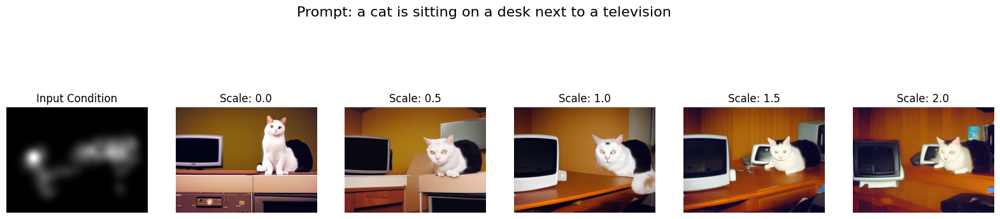

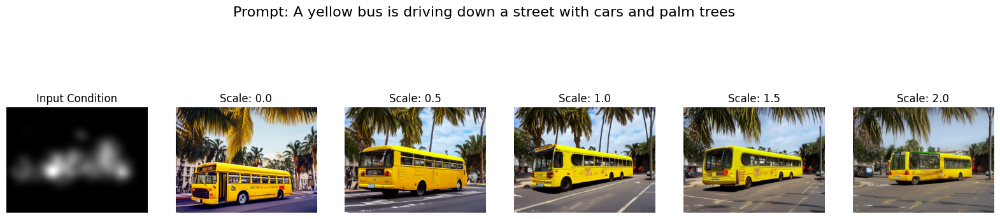

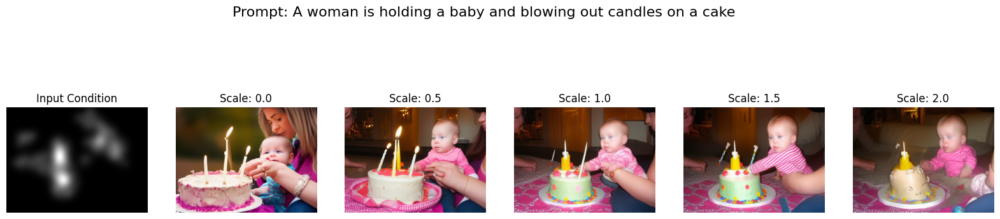

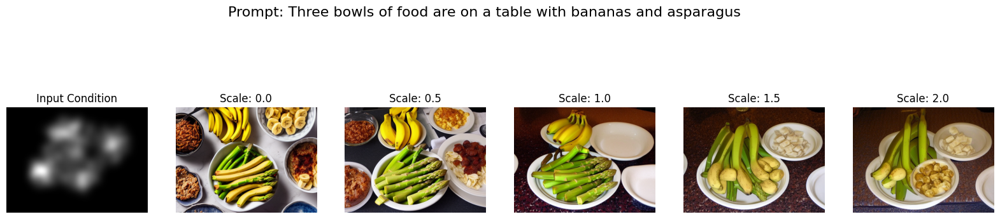

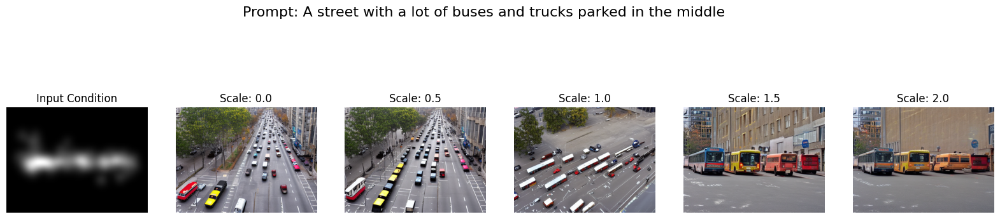

In [25]:
scales = [0.0, 0.5, 1.0, 1.5, 2.0]

for i, control_image in enumerate(control_images):
  images_a = []
  titles_a = []

  images_a.append(control_image)
  titles_a.append("Input Condition")

  for scale in scales:
      generator = torch.manual_seed(SEED)
      image = pipe(
          prompts[i],
          image=control_image,
          num_inference_steps=20,
          generator=generator,
          controlnet_conditioning_scale=scale
      ).images[0]
      images_a.append(image)
      titles_a.append(f"Scale: {scale}")

  plot_grid(images_a, titles_a, f"Prompt: {prompts[i]}")


# Ablation B: Text Prompts


--- Running Ablation B: Text Prompts ---


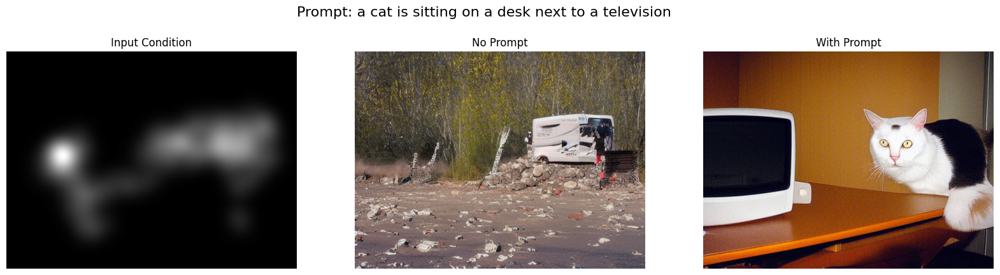

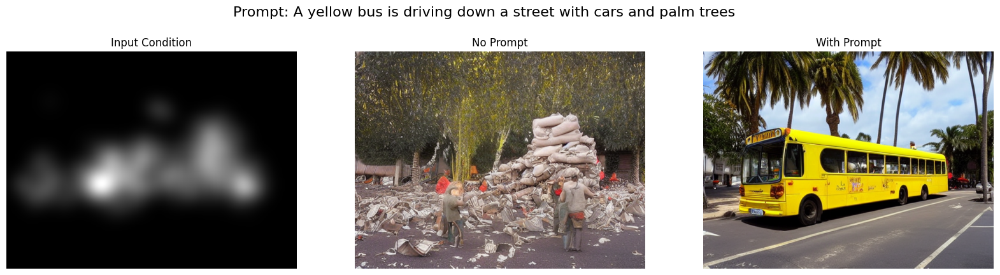

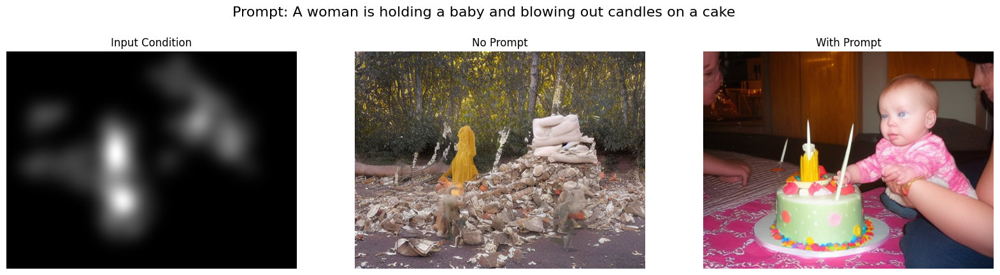

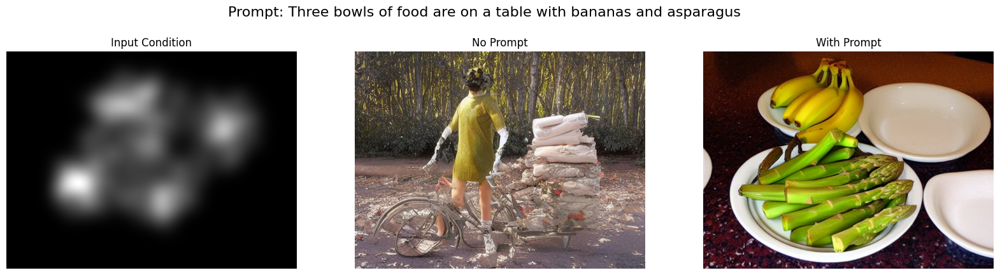

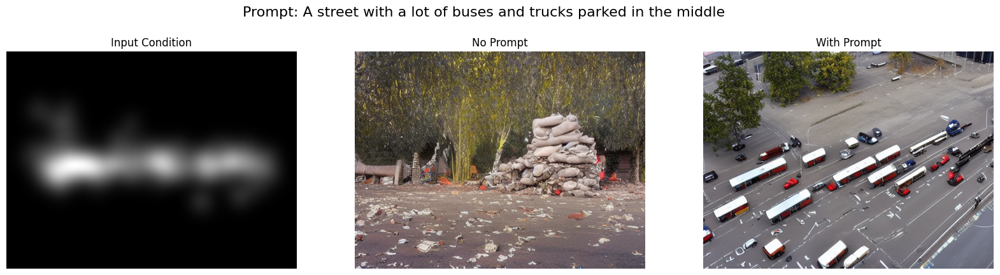

In [27]:
print("\n--- Running Ablation B: Text Prompts ---")

for i, control_image in enumerate(control_images):
  prompts_list = [
      ("No Prompt", ""),
      ("With Prompt", prompts[i])
  ]
  images_b = []
  titles_b = []

  images_b.append(control_image)
  titles_b.append("Input Condition")
  for label, text_prompt in prompts_list:
    generator = torch.manual_seed(SEED)
    image = pipe(
        text_prompt,
        image=control_image,
        num_inference_steps=20,
        generator=generator,
        controlnet_conditioning_scale=1.0 # Standard scale
    ).images[0]
    images_b.append(image)
    titles_b.append(f"{label}")

  plot_grid(images_b, titles_b, f"Prompt: {prompts[i]}")

# Ablation C: Training Duration


--- Running Ablation C: Training Duration ---
Found checkpoints: ['checkpoint-1000', 'checkpoint-2000', 'checkpoint-3000', 'checkpoint-4000', 'checkpoint-5000']
Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-1000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-2000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-3000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-4000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-5000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


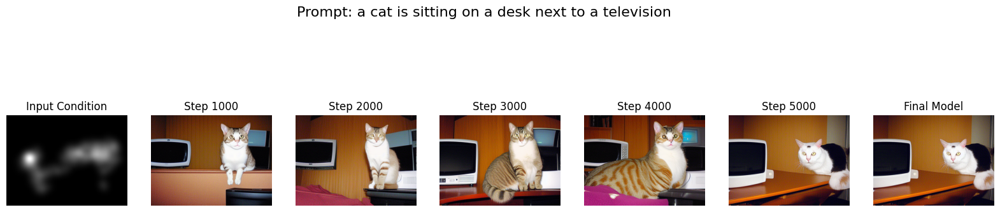

Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-1000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-2000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-3000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-4000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-5000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


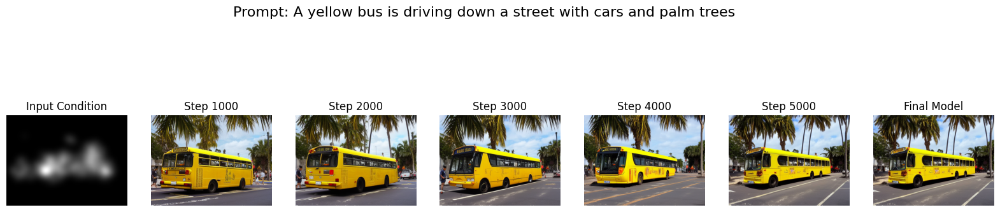

Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-1000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-2000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-3000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-4000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-5000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


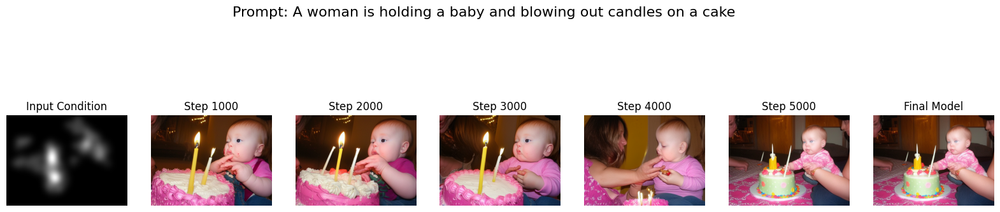

Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-1000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-2000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-3000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-4000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-5000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


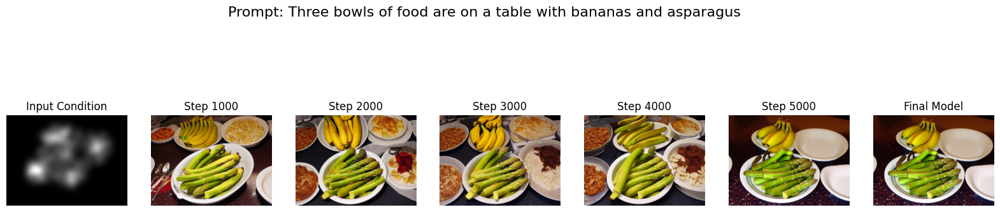

Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-1000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-2000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-3000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-4000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1/checkpoint-5000/controlnet


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet from: /content/drive/MyDrive/controlnet_model_output_v1


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


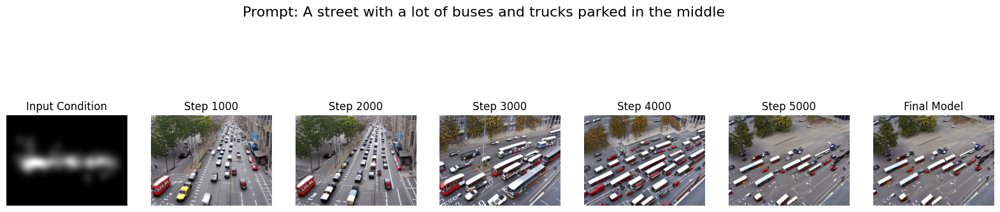

In [29]:
import gc

print("\n--- Running Ablation C: Training Duration ---")

all_folders = [f for f in os.listdir(FINAL_MODEL_DIR) if f.startswith("checkpoint-")]

sorted_checkpoints = sorted(all_folders, key=lambda x: int(x.split("-")[1]))

print(f"Found checkpoints: {sorted_checkpoints}")

for i, control_image in enumerate(control_images):
  images_c = []
  titles_c = []

  # 1. Add Control Image (First column)
  images_c.append(control_image)
  titles_c.append("Input Condition")

  for ckpt_folder in sorted_checkpoints:
    step_count = ckpt_folder.split("-")[1]

    # Construct path: .../output/checkpoint-1000/controlnet
    # Note: The training script saves weights inside a 'controlnet' subfolder within the checkpoint
    ckpt_path = os.path.join(FINAL_MODEL_DIR, ckpt_folder, "controlnet")

    # Load -> Generate -> Clean up
    try:
        pipe = get_pipeline(ckpt_path)
        generator = torch.manual_seed(SEED)

        image = pipe(
            prompts[i],
            image=control_image,
            num_inference_steps=20,
            generator=generator
        ).images[0]

        images_c.append(image)
        titles_c.append(f"Step {step_count}")

        # Free memory immediately
        del pipe
        del image
        gc.collect()
        torch.cuda.empty_cache()

    except Exception as e:
        print(f"Skipping {ckpt_folder} due to error: {e}")

  if os.path.exists(os.path.join(FINAL_MODEL_DIR, "config.json")):
    try:
        pipe = get_pipeline(FINAL_MODEL_DIR)
        generator = torch.manual_seed(SEED)
        image = pipe(
            prompts[i],
            image=control_image,
            num_inference_steps=20,
            generator=generator
        ).images[0]

        images_c.append(image)
        titles_c.append("Final Model")

        del pipe
        torch.cuda.empty_cache()
    except Exception as e:
        print(f"Could not load final model from root: {e}")

  plot_grid(images_c, titles_c, f"Prompt: {prompts[i]}")